In [2]:
import matplotlib.pyplot as plt
import anndata as adata
import scanpy as sc
from wmb import cemba, mm10
from ALLCools.mcds import MCDS
from ALLCools.clustering import significant_pc_test
from ALLCools.plot import *
import pandas as pd
from harmonypy import run_harmony

In [3]:
import os
default_n_threads = 8
os.environ['OPENBLAS_NUM_THREADS'] = f"{default_n_threads}"
os.environ['MKL_NUM_THREADS'] = f"{default_n_threads}"
os.environ['OMP_NUM_THREADS'] = f"{default_n_threads}"

In [4]:
!export OPENBLAS_NUM_THREADS=8
!export MKL_NUM_THREADS=8
!export OMP_NUM_THREADS=8

# Read single cell data

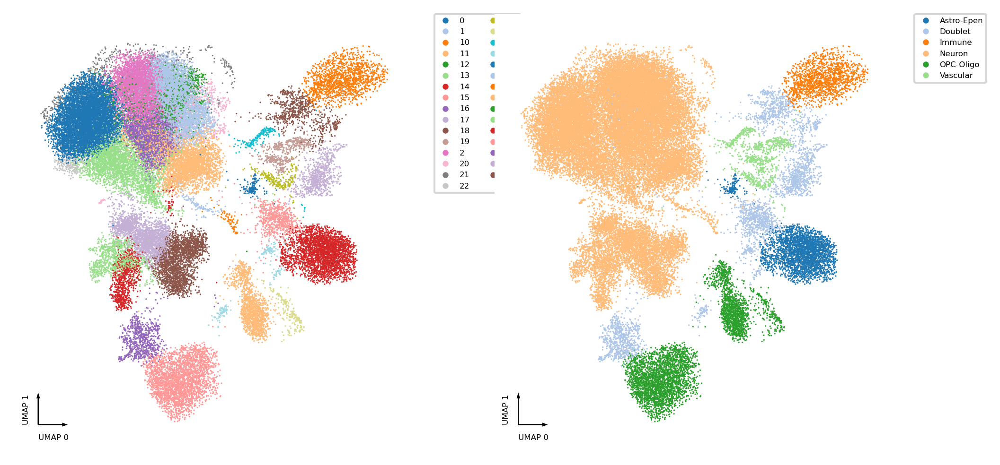

In [5]:
adata_sc = adata.read_h5ad("/data2st1/junyi/output/sc_canghao/6_combined_normalized_anndata_with_celltype.L1.h5ad")
# Fix cell type 22 to neuron
cluster_22_cells = adata_sc.obs_names[adata_sc.obs['Leiden_clusters_res1.0'] == '22']
adata_sc.obs.loc[cluster_22_cells, 'celltype.L1'] = 'Neuron'

# Show the cell type distribution
fig, axes = plt.subplots(figsize=(8, 4), dpi=300, ncols=2)
ax = axes[0]
categorical_scatter(ax=ax, data=adata_sc, hue='Leiden_clusters_res1.0', palette='tab20',show_legend=True)
ax = axes[1]
categorical_scatter(ax=ax, data=adata_sc, hue='celltype.L1', palette='tab20',show_legend=True)


# Load methlylation data

In [6]:
# Read meta data
df_mc_meta=pd.read_csv('/data2st1/junyi/methlyatlas/mCseq/CEMBA.mC.Metadata/CEMBA.mC.Metadata.csv')
# Select the cells in the PFC and Amygdala and Hippocampus
PFC_AMY_subregions = ['MOs','PL.ORB','PL,ACA,ILA','CTXsp,sAMY']
selected_cells = df_mc_meta[(df_mc_meta.SubRegion.isin(PFC_AMY_subregions)) | (df_mc_meta.MajorRegion.isin(["HPF"]))].index
selected_meta = df_mc_meta.loc[selected_cells]

In [7]:
# PFC_subregions = ['PL,ORB','PL,ACA,ILA']
# selected_cells = df_mc_meta[(df_mc_meta.SubRegion.isin(PFC_subregions))].index
# selected_meta = df_mc_meta.loc[selected_cells]

In [8]:
df_umap = pd.read_csv('/data2st1/junyi/methlyatlas/mCseq/CEMBA.mC.Coordinates/CEMBA.mC.Coordinates.csv.gz',index_col=0)

In [9]:
if selected_meta.shape[0]>20000:
    sampled_df = selected_meta.sample(n=20000, random_state=42)  # Setting a random state for reproducibility
    selected_df_meta = sampled_df.merge(df_umap,left_on="cell",right_index=True)
else:
    selected_df_meta = selected_meta.merge(df_umap,left_on="cell",right_index=True)

# Prepare L4 region level methlylation data and load the gene 2k flaking bases

In [10]:
var_dim = 'geneslop2k-vm23'
mcds = MCDS.open('/data2st1/junyi/methlyatlas/mCseq/data.nemoarchive.org/biccn/grant/u19_cemba/ecker/epigenome/cellgroup/mCseq3/mouse/processed/counts/CEMBA.snmC.mcds',
                   obs_dim='cell',var_dim=var_dim,use_obs=selected_df_meta.cell)

***** WARNING: File /tmp/pybedtools.oczcquyn.tmp has inconsistent naming convention for record:
GL456210.1	9124	58882	ENSMUSG00000079800

***** WARNING: File /tmp/pybedtools.oczcquyn.tmp has inconsistent naming convention for record:
GL456210.1	9124	58882	ENSMUSG00000079800



28457 features remained
Using existing geneslop2k-vm23_cov_mean in MCDS.coords, if this is not desired, delete the existing results by `del mcds.coords["geneslop2k-vm23_cov_mean"]` and recalculate.
27651 features remained


/tmp/ipykernel_1328529/32107.py:30: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.
  use_features &= feature_cov_mean[feature_cov_mean > min_cov].index


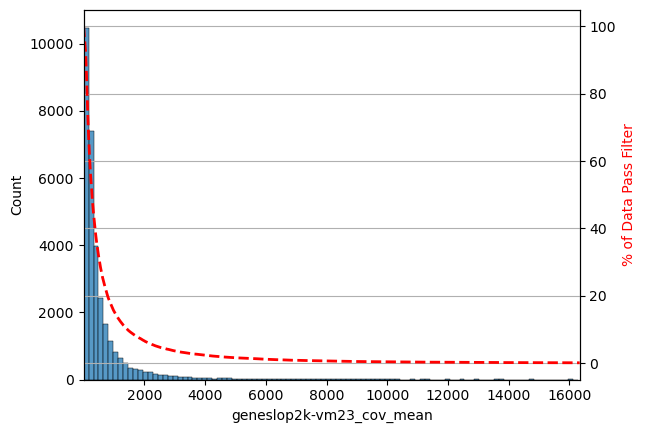

In [11]:
gene_meta_path = 'wmb/files/modified_gencode.vM23.primary_assembly.annotation.gene.flat.tsv.gz'

gene_meta = pd.read_csv(gene_meta_path, index_col='gene_id', sep='\t')

import pybedtools

genes_to_skip = set()
chrom_to_remove = ['chrM']


# skip smaller genes mostly covered by a larger gene, e.g., a miRNA within a protein coding gene.
# F=0.9 means > 90% of gene_b is overlapped with gene_a, in this case, we only keep gene_a for DMG test
gene_bed = pybedtools.BedTool.from_dataframe(
    gene_meta.reset_index()[['chrom', 'start', 'end', 'gene_id']])
mapped_bam = gene_bed.map(b=gene_bed, c=4, o='distinct', F=0.9)
for _, (*_, gene_a, gene_b_str) in mapped_bam.to_dataframe().iterrows():
    for gene_b in gene_b_str.split(','):
        if gene_b != gene_a:
            genes_to_skip.add(gene_b)

# remove certain chromosomes
genes_to_skip |= set(gene_meta.index[gene_meta['chrom'].isin(chrom_to_remove)])
use_features = gene_meta.index[~gene_meta.index.isin(genes_to_skip)]
print(f'{use_features.size} features remained')

min_cov = 5
mcds.add_feature_cov_mean()

feature_cov_mean = mcds.coords[f'{var_dim}_cov_mean'].to_pandas()
use_features &= feature_cov_mean[feature_cov_mean > min_cov].index

print(f'{use_features.size} features remained')


In [12]:
# Filter the features
mcds.filter_feature_by_cov_mean(min_cov=min_cov)
mcds.add_mc_frac(normalize_per_cell=True, clip_norm_value=10)

mcds = mcds[['geneslop2k-vm23_da_frac']]
mcds['geneslop2k-vm23_da_frac'] = mcds['geneslop2k-vm23_da_frac'].astype('float32')

#mcds.write_dataset('output/geneslop2k-vm23_frac.mcds', var_dims=['geneslop2k-vm23'],mode='w')

use_gene_meta = gene_meta.loc[use_features]
#use_gene_meta.to_csv('output/GeneMetadata.csv.gz')


Before cov mean filter: 32208 geneslop2k-vm23
 After cov mean filter: 31425 geneslop2k-vm23 97.6%


In [13]:

mcg = mcds.get_adata(mc_type='CGN',var_dim='geneslop2k-vm23',obs_dim='cell')

select_hvf is True, but no highly variable feature results found, use all features instead.


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/junyichen/anaconda3/envs

In [14]:
mch = mcds.get_adata(mc_type='CHN',var_dim='geneslop2k-vm23',obs_dim='cell')

select_hvf is True, but no highly variable feature results found, use all features instead.


# Prepare L4 region level metadata

In [15]:
meta_data = df_mc_meta
meta_data.head()

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,InputReads,PassBasicQC,PlateNormCov,CEMBARegion,MajorRegion,SubRegion,CellGroup,SubClass,Class,NeuroTransmitters
0,10A_M_1,0.008874,0.819390,0.036336,1073981.0,RSP-4,CEMBA190423_10A_1,0,1,10,...,2252674,True,0.834409,10A,Isocortex,RSP,c18_c4_c1_c1_r0,L6b CTX Glut,NP-CT-L6b Glut,Glut
1,10A_M_100,0.007105,0.762382,0.019705,1108484.0,RSP-4,CEMBA190423_10A_2,0,3,10,...,2549478,True,0.842048,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
2,10A_M_1000,0.006450,0.744689,0.016373,1443814.0,RSP-4,CEMBA190423_10A_4,7,5,10,...,3342484,True,1.031215,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
3,10A_M_1001,0.007433,0.780743,0.029361,1372174.0,RSP-4,CEMBA190423_10A_3,8,4,10,...,3220214,True,0.942444,10A,Isocortex,RSP,c2_c3_c4_c2_r0,L6 CT CTX Glut,NP-CT-L6b Glut,Glut
4,10A_M_1002,0.006215,0.741165,0.018129,1650777.0,RSP-4,CEMBA190423_10A_3,8,5,10,...,3871980,True,1.133796,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut


# Group metat for cell group level
- some are median 
- some are sum

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:788: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [228008, 228041, 228052, 228193, 228195]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:788: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [228008, 228041, 228052, 228193, 228195]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


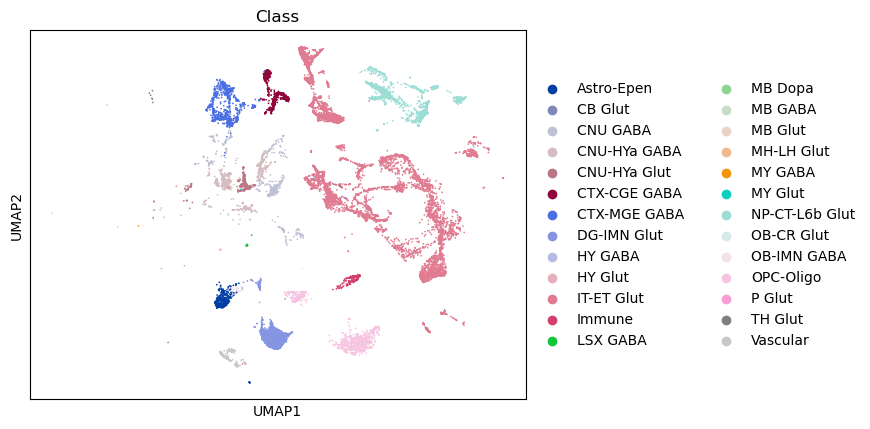

In [16]:
mcg.obs = mcg.obs.merge(selected_df_meta,left_index=True,right_on='cell')    
mcg.obsm['X_umap'] = mcg.obs[['mc_all_umap_0', 'mc_all_umap_1']].values

mch.obs = mch.obs.merge(selected_df_meta,left_index=True,right_on='cell')  
mch.obsm['X_umap'] = mch.obs[['mc_all_umap_0', 'mc_all_umap_1']].values
sc.pl.umap(mcg, color=['Class'], ncols=2)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


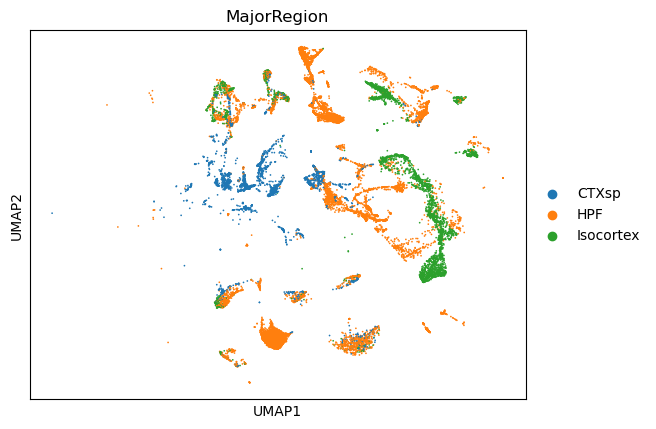

In [17]:
sc.pl.umap(mch, color=['MajorRegion'], ncols=2)

# Prepare the mcds file will 100k bin 

Using existing chrom100k_cov_mean in MCDS.coords, if this is not desired, delete the existing results by `del mcds.coords["chrom100k_cov_mean"]` and recalculate.
Before cov mean filter: 27269 chrom100k
 After cov mean filter: 25187 chrom100k 92.4%
1166 chrom100k features removed due to overlapping (bedtools intersect -f 0.2) with black list regions.
1 chrom100k features in ['chrM'] removed.


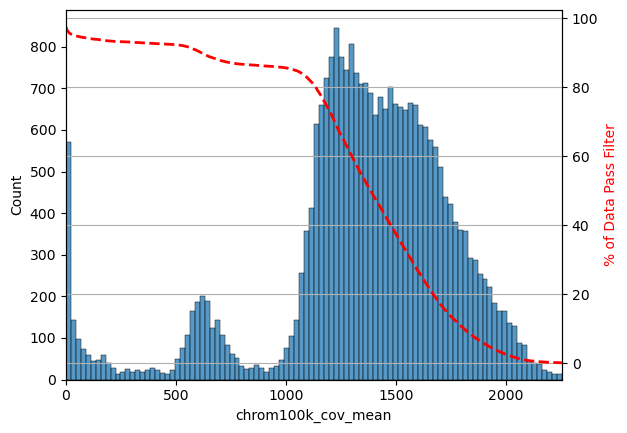

In [18]:
var_dim = 'chrom100k'
mcds_bin = MCDS.open('/data2st1/junyi/methlyatlas/mCseq/data.nemoarchive.org/biccn/grant/u19_cemba/ecker/epigenome/cellgroup/mCseq3/mouse/processed/counts/CEMBA.snmC.mcds',
                   obs_dim='cell',var_dim=var_dim,use_obs=selected_df_meta.cell)

total_feature = mcds_bin.get_index(var_dim).size
mcds_bin

selected_df_meta.set_index('cell',inplace=True)
mcds_bin.add_cell_metadata(selected_df_meta)

mcds_bin.add_feature_cov_mean(var_dim=var_dim)

# feature cov cutoffs
min_cov = 500
max_cov = 3000
black_list_fraction = 0.2
black_list_path = mm10.ENCODE_BLACKLIST_PATH
exclude_chromosome = ['chrM']
# HVF
mch_pattern = 'CHN'
mcg_pattern = 'CGN'
n_top_feature = 20000

# PC cutoff
pc_cutoff = 0.1

# KNN
knn = -1  # -1 means auto determine

# Leiden
resolution = 1


# filter by coverage - based on the distribution above
mcds_bin = mcds_bin.filter_feature_by_cov_mean(
    min_cov=min_cov,  # minimum coverage
    max_cov=max_cov  # maximum coverage
)

# remove blacklist regions
mcds_bin = mcds_bin.remove_black_list_region(
    black_list_path=black_list_path,
    f=black_list_fraction  # Features having overlap > f with any black list region will be removed.
)

# remove chromosomes
mcds_bin = mcds_bin.remove_chromosome(exclude_chromosome)
mcds_bin
load = True
mcds_bin.add_mc_frac(
normalize_per_cell=True,  # after calculating mC frac, per cell normalize the matrix
    clip_norm_value=10  # clip outlier values above 10 to 10
)
obs_dim = 'cell'

# load only the mC fraction matrix into memory so following steps is faster
# Only load into memory when your memory size is enough to handle your dataset
if load and (mcds_bin.get_index(obs_dim).size < 20000):
    mcds_bin[f'{var_dim}_da_frac'].load()


In [19]:
mch_bin_hvf = mcds_bin.calculate_hvf_svr(var_dim=var_dim,
                                 mc_type=mcg_pattern,
                                 n_top_feature=n_top_feature,
                                 plot=True)

Fitting SVR with gamma 0.0416, predicting feature dispersion using mc_frac_mean and cov_mean.
Total Feature Number:     24032
Highly Variable Feature:  20000 (83.2%)


In [20]:
mcg_bin_adata = mcds_bin.get_adata(mc_type=mcg_pattern,
                           var_dim=var_dim,
                           select_hvf=True)

In [21]:
from ALLCools.clustering import tsne, significant_pc_test, log_scale
from ALLCools.plot import *

In [22]:
log_scale(mcg_bin_adata)


StandardScaler(with_mean=False)

45 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (20000, 50) to (20000, 45)
Red axis labels are used PCs


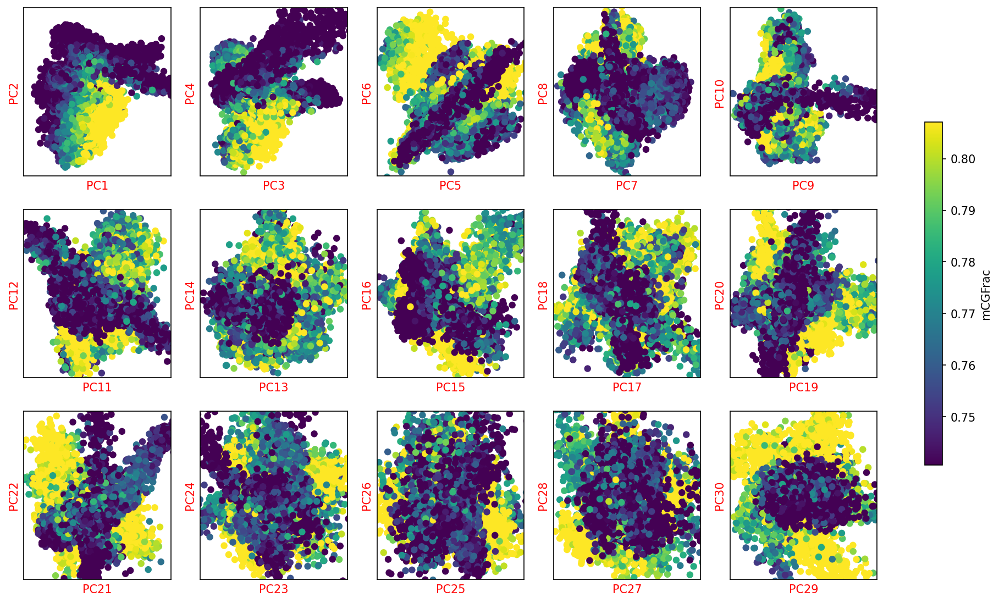

In [23]:
mcg_col_name = 'mCGFrac'  # Name may change

sc.tl.pca(mcg_bin_adata)
cg_n_components = significant_pc_test(mcg_bin_adata)
fig, axes = plot_decomp_scatters(mcg_bin_adata,
                                 n_components=cg_n_components,
                                 hue=mcg_col_name,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=3,
                                 ncols=5)

In [24]:
mch_hvf = mcds_bin.calculate_hvf_svr(var_dim=var_dim,
                                 mc_type=mch_pattern,
                                 n_top_feature=n_top_feature,
                                 plot=True)


Fitting SVR with gamma 0.0416, predicting feature dispersion using mc_frac_mean and cov_mean.
Total Feature Number:     24032
Highly Variable Feature:  20000 (83.2%)


In [25]:
mch_bin_adata = mcds_bin.get_adata(mc_type=mch_pattern,
                           var_dim=var_dim,
                           select_hvf=True)
mch_bin_adata


AnnData object with n_obs × n_vars = 20000 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select'

50 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (20000, 50) to (20000, 50)
Red axis labels are used PCs


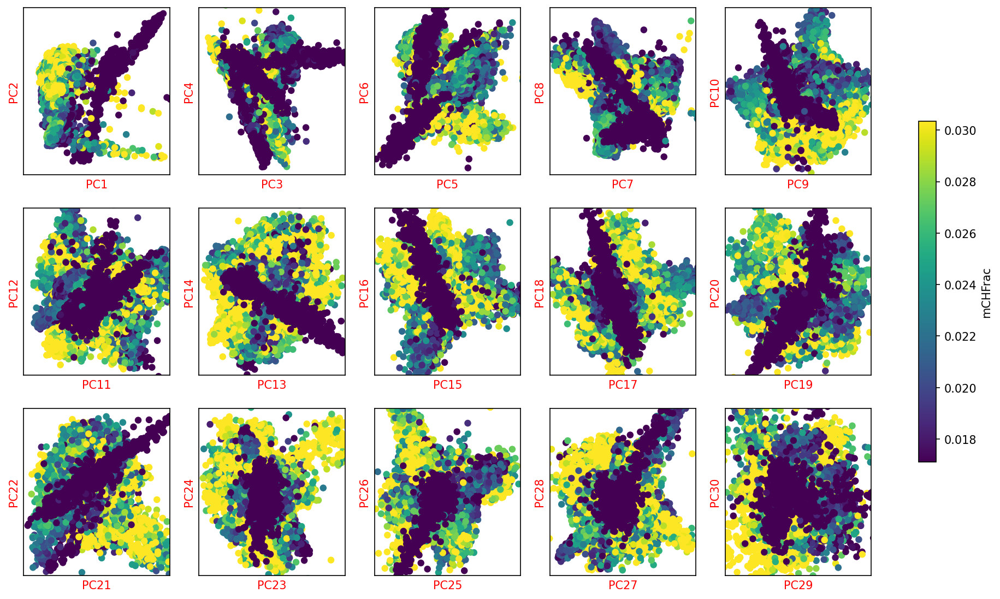

In [26]:
mch_col_name = "mCHFrac"
sc.tl.pca(mch_bin_adata)
ch_n_components = significant_pc_test(mch_bin_adata)
fig, axes = plot_decomp_scatters(mch_bin_adata,
                                 n_components=ch_n_components,
                                 hue=mch_col_name,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=3,
                                 ncols=5)

In [27]:
import numpy as np
ch_pcs = mch_bin_adata.obsm['X_pca'][:, :ch_n_components]
cg_pcs = mcg_bin_adata.obsm['X_pca'][:, :cg_n_components]

cg_pcs = cg_pcs / cg_pcs.std()
ch_pcs = ch_pcs / ch_pcs.std()

# total_pcs
total_pcs = np.hstack([ch_pcs, cg_pcs])

# make a copy of adata, add new pcs
# this is suboptimal, will change this when adata can combine layer and X in the future
adata_merged = mch_bin_adata.copy()
adata_merged.obsm['X_pca'] = total_pcs


In [28]:
if knn == -1:
    knn = max(15, int(np.log2(adata_merged.shape[0])*2))

sc.pp.neighbors(adata_merged, n_neighbors=knn)

sc.tl.leiden(adata_merged, resolution=resolution)

sc.tl.umap(adata_merged)



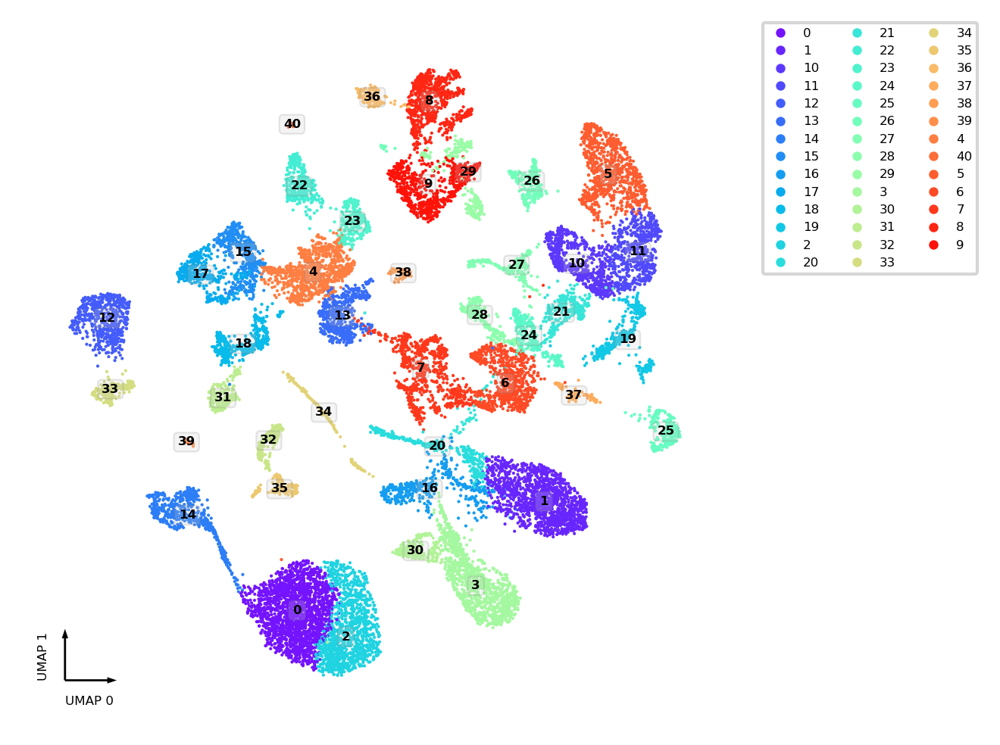

In [29]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata_merged,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        text_anno='leiden',
                        show_legend=True)


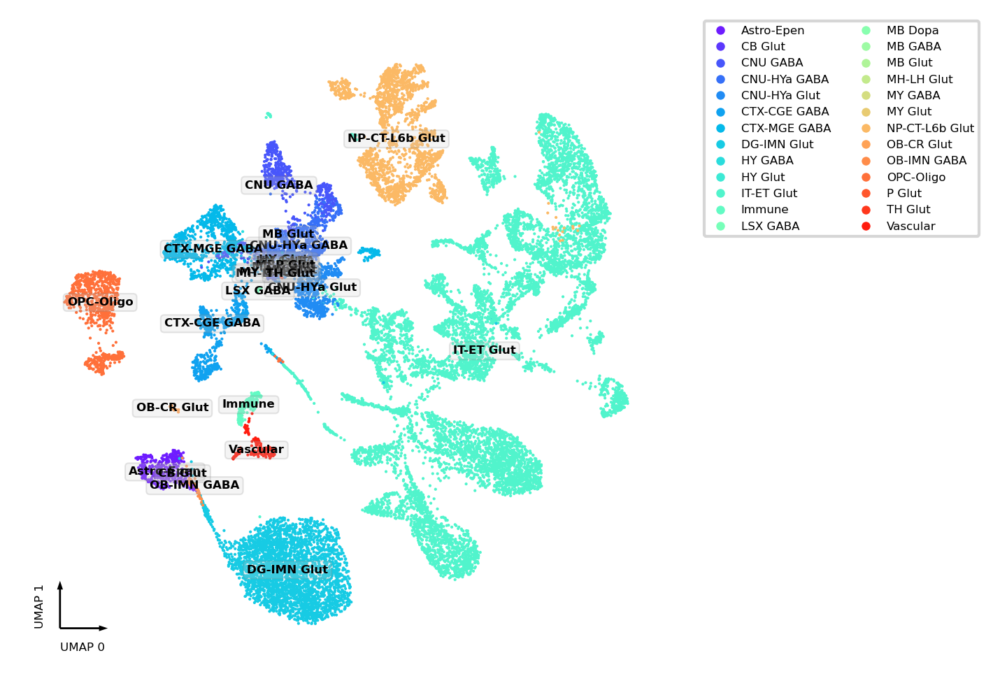

In [30]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata_merged,
                        ax=ax,
                        coord_base='umap',
                        hue='Class',
                        text_anno='Class',
                        show_legend=True)


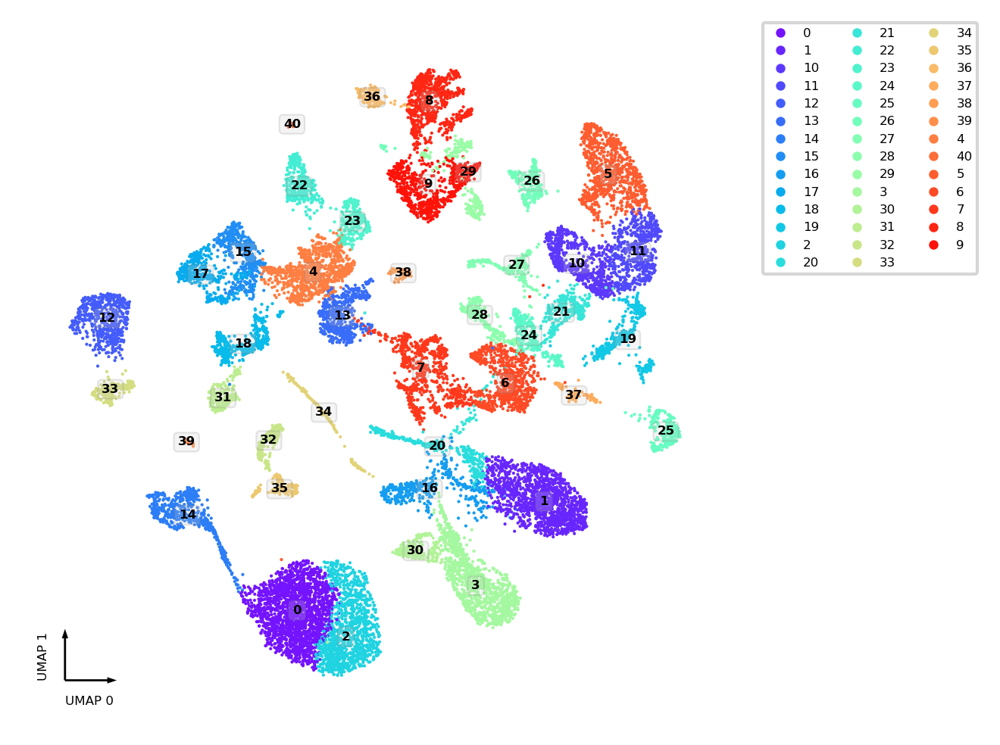

In [31]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata_merged,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        text_anno='leiden',
                        show_legend=True)

In [32]:
pd.DataFrame(set(adata_merged.obs['SubClass'])).to_csv('output/subclass.csv.gz')

In [33]:
interactive_scatter(data=mcg,
                    hue='Class',
                    coord_base='umap',
                    max_points=3000)

In [34]:
interactive_scatter(data=adata_merged,
                    hue='Class',
                    coord_base='umap',
                    max_points=3000)

In [35]:
map_subclass_class = dict(zip(adata_merged.obs['SubClass'], adata_merged.obs['Class']))

In [36]:
# cell_class = adata_sc.obs['pred_mwb'].str.replace(r'^\d+\s', '')
# convert_class = []
# for i in range(0,len(cell_class)):
#     cc = cell_class[i] 
#     if cc not in map_subclass_class:
#         convert_class.append(cc)
#     else:
#         convert_class.append(map_subclass_class[cc])   


In [37]:
# adata_sc.obs['pred_Class'] = convert_class

In [38]:
interactive_scatter(data=adata_merged,
                    hue='leiden',
                    coord_base='umap',
                    max_points=5000)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



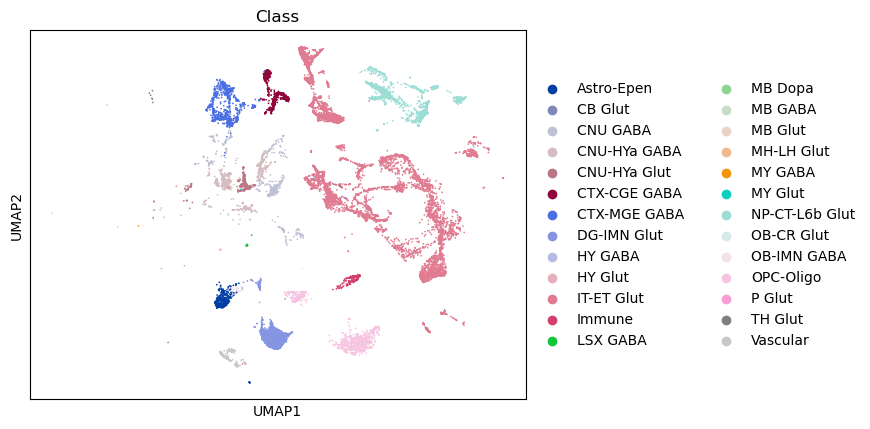

In [39]:
sc.pl.umap(mcg, color=['Class'], ncols=2)

In [40]:
adata_merged.write_h5ad('output/Brain-3regions-chrom100k-clustering.h5ad')
adata_merged


AnnData object with n_obs × n_vars = 20000 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1', 'leiden'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select'
    uns: 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [41]:
adata_merged.obs.to_csv('output/Brain-3regions-ClusteringResults.csv.gz')
adata_merged.obs.head()


,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,Sample,...,NeuroTransmitters,mc_all_tsne_0,mc_all_tsne_1,mc_all_umap_0,mc_all_umap_1,mr_tsne_0,mr_tsne_1,mr_tsne_0.1,mr_tsne_1.1,leiden
cell,,,,,,,,,,,,,,,,,,,,,
10D_M_64,0.006438,0.765780,0.022757,1491961.0,RHP-1,CEMBA201203_10D_5,14,0,10,10D_201203,...,Glut,55.077990,-17.641394,18.129213,1.519717,13.998060,-16.327232,13.998060,-16.327232,19
10D_M_98,0.007231,0.761465,0.025830,1004956.0,RHP-1,CEMBA201203_10D_5,2,8,10,10D_201203,...,Glut,55.956280,-16.668024,17.722948,2.063337,14.014369,-17.151241,14.014369,-17.151241,19
10D_M_111,0.006220,0.763170,0.022399,1118411.0,RHP-1,CEMBA201203_10D_5,15,12,10,10D_201203,...,Glut,55.376200,-17.724155,18.237843,1.559935,14.028082,-16.332813,14.028082,-16.332813,19
10D_M_263,0.007939,0.762790,0.025978,1538405.0,RHP-1,CEMBA201203_10D_5,20,2,10,10D_201203,...,Glut,54.280155,-16.852920,17.527954,1.093661,12.971472,-16.250986,12.971472,-16.250986,19
10D_M_265,0.006589,0.755702,0.021547,1164056.0,RHP-1,CEMBA201203_10D_5,8,2,10,10D_201203,...,Glut,55.164460,-17.910550,18.236850,1.520383,14.134044,-16.185085,14.134044,-16.185085,19


In [42]:
n_genes =10000

In [43]:
sc.pp.highly_variable_genes(mcg, n_top_genes=n_genes, n_bins=20)
sc.pp.highly_variable_genes(mch, n_top_genes=n_genes, n_bins=20)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:218: RuntimeWarning:

invalid value encountered in log

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:218: RuntimeWarning:

invalid value encountered in log



In [44]:
adata_sc.var['gane_name'] = adata_sc.var.index
adata_sc.var.set_index('gene_ids',inplace=True)

In [45]:
adata_atac_gene = adata.read_h5ad('/data2st1/junyi/output/mouse_brain_gene.h5ads')
#adata_atac_bin = adata.read_h5ad('/data2st1/junyi/snATAC_02_matrix/WT_PFC_W26_5kb.h5ad')

In [46]:
adata_atac_selected = adata_atac_gene
adata_atac_selected

AnnData object with n_obs × n_vars = 139374 × 55808
    obs: 'sample', 'sample_barcode', 'obs_names', 'celltype.L2.p', 'celltype.L1.p', 'leiden', 'celltype.L1.GBoost', 'celltype.L1.tab'
    obsm: 'X_spectral', 'X_spectral_harmony', 'X_spectral_mnn', 'X_umap', 'fragment_paired'

In [47]:
def dump_embedding(adata, name, n_dim=2):
    # put manifold coordinates into adata.obs
    for i in range(n_dim):
        adata.obs[f'{name}_{i}'] = adata.obsm[f'X_{name}'][:, i]
    return


In [48]:
adata_atac_selected.obsm['X_pca'] = adata_atac_selected.obsm['X_spectral_harmony']

In [49]:
# sc.pp.neighbors(adata_atac_selected)
# sc.tl.leiden(adata_atac_selected, resolution=1)
# sc.tl.umap(adata_atac_selected)
dump_embedding(adata_atac_selected, 'umap')


In [50]:
dump_embedding(adata_atac_selected, 'umap')
#dump_embedding(adata_atac_selected, 'umap_seurat')


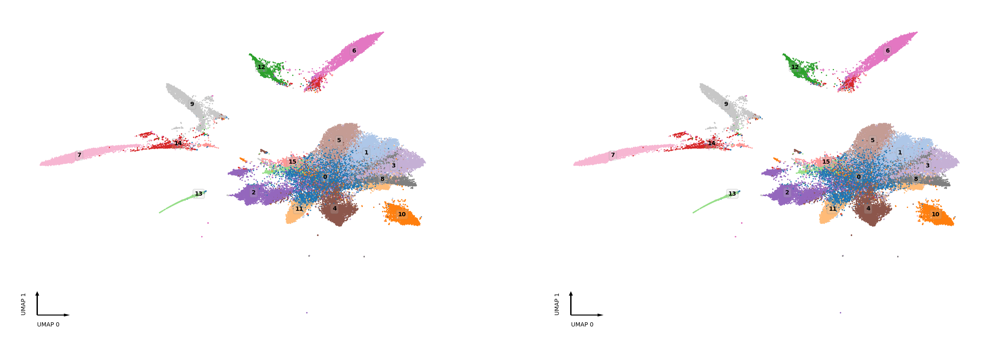

In [51]:
fig, axes = plt.subplots(figsize=(12, 4), dpi=250, ncols=2)

ax = axes[0]
_ = categorical_scatter(data=adata_atac_selected.obs,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        palette='tab20',
                        text_anno='leiden')
ax = axes[1]
_ = categorical_scatter(data=adata_atac_selected.obs,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        palette='tab20',
                        text_anno='leiden')



In [52]:
n_components = significant_pc_test(adata_atac_selected)


Downsample PC matrix to 50000 cells to calculate significant PC components


30 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (139374, 30) to (139374, 30)


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decompos

Red axis labels are used PCs


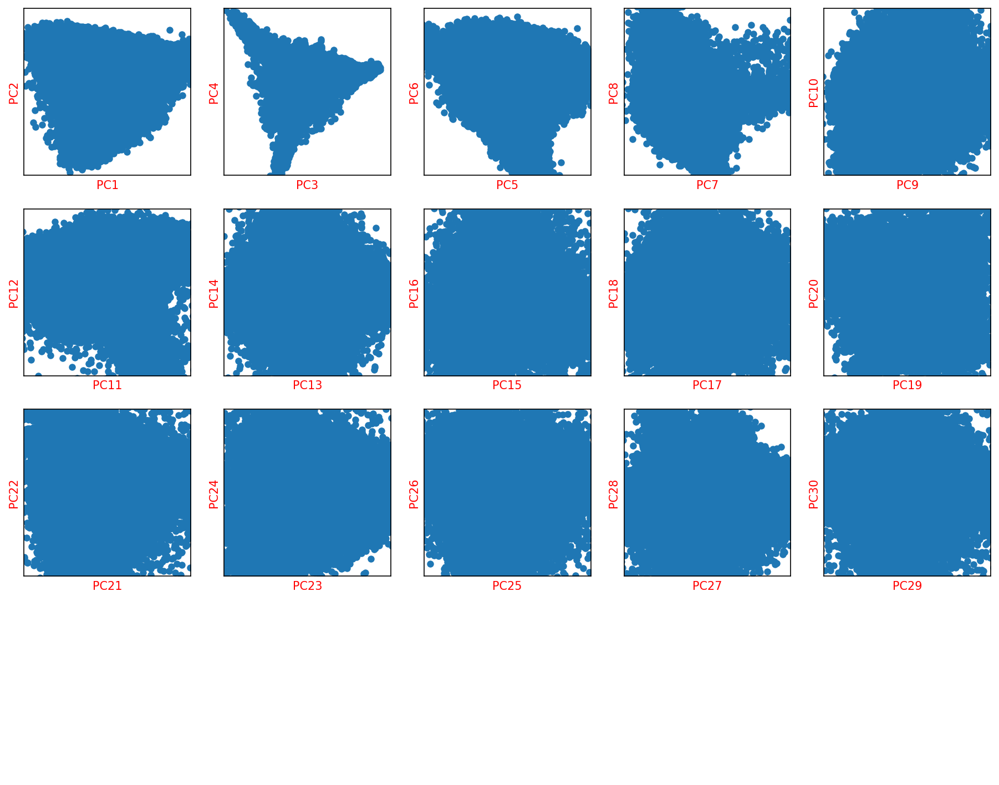

In [53]:
fig, axes = plot_decomp_scatters(adata_atac_selected,
                                 n_components=n_components,
                                 hue=None,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=5,
                                 ncols=5)

In [54]:
adata_atac_selected.layers["counts"] = adata_atac_selected.X.copy()
sc.pp.normalize_total(adata_atac_selected)
# Logarithmize the data
sc.pp.log1p(adata_atac_selected)


In [55]:
# n_genes = 10000
sc.pp.highly_variable_genes(adata_atac_selected, n_top_genes=n_genes, n_bins=20) 

In [56]:
adata_atac_selected.var['gene_id'] = adata_atac_selected.var.index.str.split('.').str[0]

In [57]:
adata_atac_selected.var.set_index('gene_id',inplace=True)

In [58]:
# Preprocess the gene to ensemble id mapping
df_gene = pd.read_csv('/data2st1/junyi/generegion_vM33/genebody.bed',index_col=0,sep='\t',header=None)
df_gene_map = df_gene.iloc[:,[4,5]]
df_gene_map.columns = ['gene_id','gene_name']

df_gene_map.drop_duplicates(subset='gene_id',inplace=True)
df_result = df_gene_map.merge(adata_atac_selected.var,left_on='gene_id',right_index=True,how='right')
rows_with_missing_gene_name = df_result[df_result['gene_id'].isnull()]

df_result.loc[rows_with_missing_gene_name.index,'gene_id'] = df_result.loc[rows_with_missing_gene_name.index,'gene_name']

df_result['chr']= df_result.index
df_result.columns =['gene_name', 'gene_id', 'highly_variable', 'means', 'dispersions','dispersions_norm', 'chr']
df_result.set_index('gene_name',inplace=True)
df_result['gene_id'] = df_result['gene_id'].str.split('.').str[0]
df_result['gene_name'] = df_result.index

/tmp/ipykernel_1328529/4062948613.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [65]:
df_result.loc[df_result.gene_id.isnull(),'gene_id'] = df_result.loc[df_result.gene_id.isnull(),'gene_name'] 

In [67]:
adata_atac_selected.var = df_result.set_index('gene_id')

In [68]:
adata_atac_selected.var_names_make_unique()

In [69]:
sc.pp.highly_variable_genes(adata_sc, n_top_genes=n_genes, n_bins=20) 

In [70]:
sc_hvf_list = adata_sc.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index
mcg_hvf_list = mcg.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index
mch_hvf_list = mch.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index
atac_hvf_list = adata_atac_selected.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index


In [71]:
atac_hvf_list

Index(['Olfr130', 'ENSMUSG00000117210', 'ENSMUSG00000107983',
       'ENSMUSG00000092461', 'Olfr131', 'ENSMUSG00000092186',
       'ENSMUSG00000092295', 'ENSMUSG00000103121', 'ENSMUSG00000103537',
       'ENSMUSG00000039193',
       ...
       'ENSMUSG00000084320', 'ENSMUSG00000074637', 'ENSMUSG00000100641',
       'Olfr70', 'ENSMUSG00000105297', 'Olfr1463', 'ENSMUSG00000027864',
       'ENSMUSG00000011263', 'ENSMUSG00000029102', 'ENSMUSG00000104494'],
      dtype='object', name='gene_id', length=10000)

In [72]:
hvfs = mcg_hvf_list.intersection(sc_hvf_list).intersection(mcg_hvf_list).intersection(atac_hvf_list)

In [73]:
adata_sc_selected = adata_sc

In [74]:
sc_hvf_adata = adata_sc_selected[:,hvfs].copy()
sc.pp.scale(sc_hvf_adata)
sc_hvf_adata

AnnData object with n_obs × n_vars = 735462 × 1051
    obs: 'batch', 'sex', 'treatment', 'mouseID', 'region', 'tech', 'batch_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'Louvain_clusters_res1.0', 'Leiden_clusters_res1.0', 'celltype.L1'
    var: 'feature_types', 'genome', 'mt', 'gane_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Leiden_clusters_res1.0_colors', 'Louvain_clusters_res1.0_colors', 'celltype.L1_colors', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'

In [75]:
mcg.var.index = mcg.var.index.astype(str)
mcg.obs.index = mcg.obs.index.astype(str)
mch.var.index = mch.var.index.astype(str)
mch.obs.index = mch.obs.index.astype(str)

In [76]:
mcg_hvf_adata = mcg[:,hvfs].copy()
sc.pp.scale(mcg_hvf_adata)
mcg_hvf_adata.X *=-1

In [77]:
mch_hvf_adata = mch[:,hvfs].copy()
sc.pp.scale(mch_hvf_adata)
mch_hvf_adata.X *=-1

In [78]:
from ALLCools.pseudo_cell import generate_pseudo_cells_kmeans

adata_atac_pseudo = generate_pseudo_cells_kmeans(adata_atac_selected,
                                            cluster_col='leiden',
                                            obsm='X_pca',
                                            cluster_size_cutoff=100,
                                            max_pseudo_size=50,
                                            aggregate_func='downsample')


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series 

In [79]:
adata_atac_pseudo
sc.pp.normalize_per_cell(adata_atac_pseudo)
sc.pp.log1p(adata_atac_pseudo)

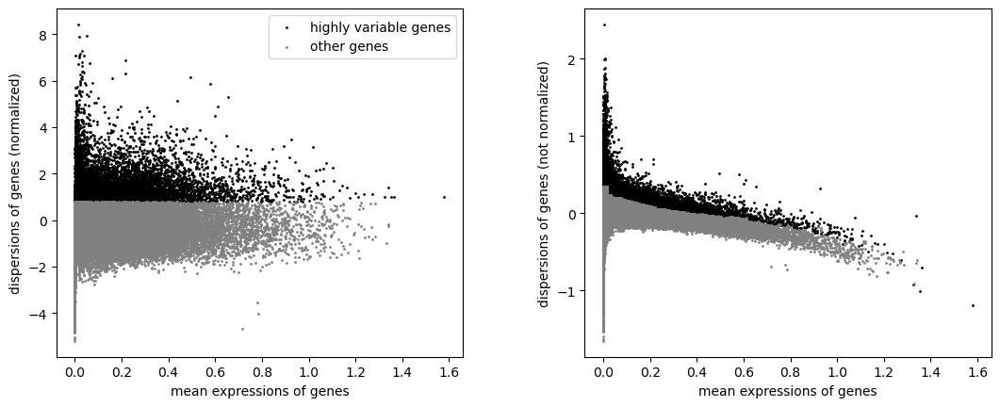

In [80]:
sc.pp.highly_variable_genes(adata_atac_pseudo, n_top_genes=10000, n_bins=100)
sc.pl.highly_variable_genes(adata_atac_pseudo)
test_adata = adata_atac_pseudo[:, adata_atac_pseudo.var['highly_variable']].copy()


In [81]:
sc.pp.scale(test_adata)
sc.tl.pca(test_adata)
sc.pp.neighbors(test_adata)
sc.tl.umap(test_adata)
sc.tl.leiden(test_adata)
test_adata.obs['group'] = test_adata.obs_names.map(lambda i: '.'.join(i.split('.')[:2]))

In [82]:
test_adata.obs['lenden_snap'] = adata_atac_pseudo.obs['leiden']

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



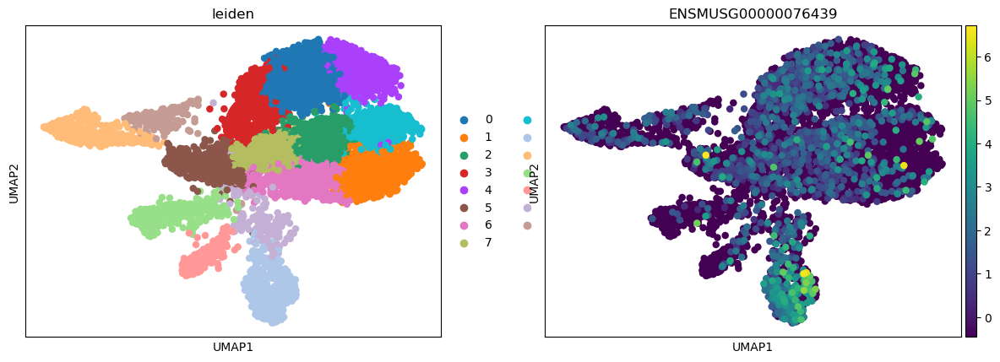

In [83]:
sc.pl.umap(test_adata, color=['leiden','ENSMUSG00000076439'],size=150)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



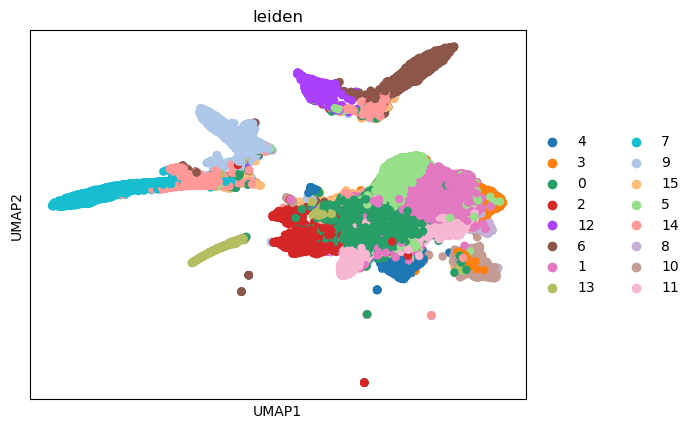

In [122]:
sc.pl.umap(adata_atac_selected, color=['leiden'],size=150) 

In [84]:
adata_atac_pseudo.obs['leiden_snap'] = adata_atac_pseudo.obs['leiden']

In [85]:
adata_atac_pseudo.write_h5ad(f'output/ATAC.PseudoCellAdata.3regions.h5ad')

In [86]:
adata_sc_pseudo = generate_pseudo_cells_kmeans(adata_sc,
                                            cluster_col='celltype.L1',
                                            obsm='X_pca',
                                            cluster_size_cutoff=100,
                                            max_pseudo_size=50,
                                            aggregate_func='downsample')

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/pseudo_cell/pseudo_cell_kmeans.py:11: FutureWarning:

The default dtype for empty Series 

In [87]:
adata_sc_pseudo

AnnData object with n_obs × n_vars = 35720 × 32285
    obs: 'n_cells', 'celltype.L1'
    var: 'feature_types', 'genome', 'mt', 'gane_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

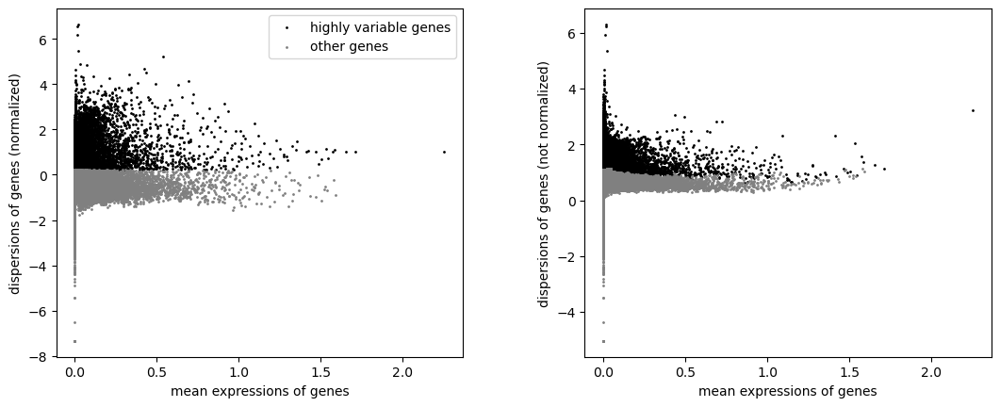

In [88]:
sc.pp.normalize_per_cell(adata_sc_pseudo)
sc.pp.log1p(adata_sc_pseudo)

sc.pp.highly_variable_genes(adata_sc_pseudo, n_top_genes=10000, n_bins=100)
sc.pl.highly_variable_genes(adata_sc_pseudo)
test_adata = adata_sc_pseudo[:, adata_sc_pseudo.var['highly_variable']].copy()


In [89]:
# remove low cov gene
adata_sc_pseudo.write_h5ad(f'output/PseudoCellAdata.3regions.h5ad')


In [90]:
sc.pp.scale(test_adata)
sc.tl.pca(test_adata)
sc.pp.neighbors(test_adata)
sc.tl.umap(test_adata)
sc.tl.leiden(test_adata)


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



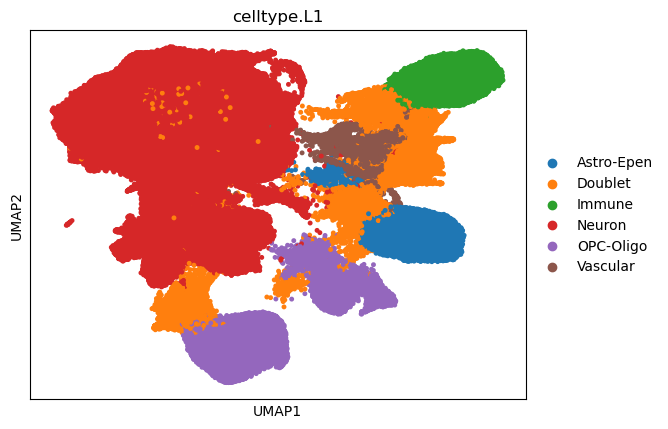

In [121]:
sc.pl.umap(adata_sc, color=['celltype.L1'],size=50)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



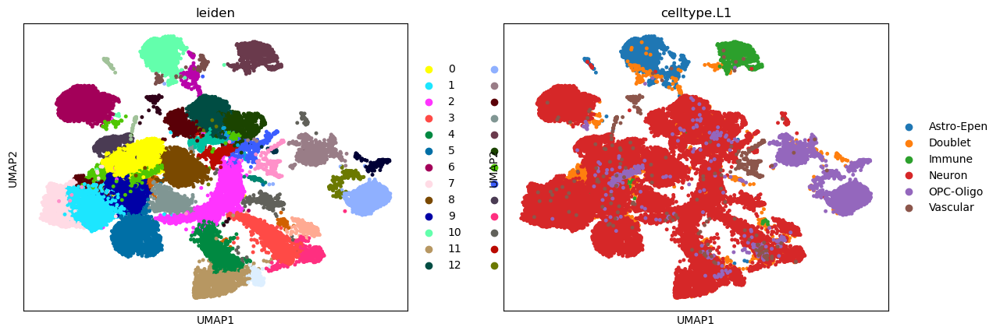

In [119]:
sc.pl.umap(test_adata, color=['leiden','celltype.L1'],size=50)

In [95]:
adata_atac_selected.obs.to_csv('output/ATAC.3regions.MetaData.csv.gz')
adata_sc_selected.obs.to_csv('output/Brain.3regions.MetaData.csv.gz')

In [96]:
atac_hvf_adata = adata_atac_selected[:,hvfs].copy()
sc.pp.scale(atac_hvf_adata)

In [97]:
adata_concat = sc_hvf_adata.concatenate([
    mcg_hvf_adata,
    mch_hvf_adata,
    atac_hvf_adata
    
],
                                index_unique='-')
adata_concat.obs['batch'] = adata_concat.obs['batch'].map({
    '0': 'sc',
    '1': 'mcg',
    '2': 'mch',
    '3': 'atac'
    })
adata_concat

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning:

The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html



AnnData object with n_obs × n_vars = 914836 × 1051
    obs: 'batch', 'sex', 'treatment', 'mouseID', 'region', 'tech', 'batch_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'Louvain_clusters_res1.0', 'Leiden_clusters_res1.0', 'celltype.L1', 'cell', 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1', 'sample', 'sample_barcode', 'obs_names', 'celltype.L2.p', 'celltype.L1.p', 'leiden', 

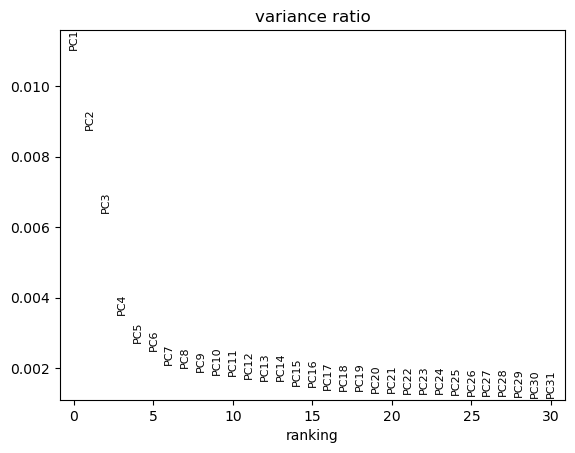

Downsample PC matrix to 50000 cells to calculate significant PC components
50 components passed P cutoff of 0.2.
Changing adata.obsm['X_pca'] from shape (914836, 50) to (914836, 50)


In [98]:
sc.pp.pca(adata_concat, n_comps=50)
sc.pl.pca_variance_ratio(adata_concat)
n_components = significant_pc_test(adata_concat, p_cutoff=0.2)


In [99]:
adata_concat.obs['predicted_doublet'].fillna('False',inplace=True)
adata_concat.obs["predicted_doublet"] = adata_concat.obs["predicted_doublet"].astype(bool)

adata_concat.var['mt-0'] = adata_concat.var["mt-0"].astype(bool)
#adata_concat.var['highly_variable-0-0'] = adata_concat.var["highly_variable-0-0"].astype(bool)
#adata_concat.var['highly_variable-1-0'] = adata_concat.var["highly_variable-1-0"].astype(bool)
#adata_concat.var['highly_variable-0'] = adata_concat.var["highly_variable-0"].astype(bool)

adata_concat.obs['PassBasicQC'] = adata_concat.obs["PassBasicQC"].astype(bool)


In [100]:
adata_concat.write_h5ad('output/merged-3region-concat-clustering.h5ad')

In [101]:
scps_hvf_list = adata_sc_pseudo.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index
atacps_hvf_list = adata_atac_pseudo.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index


In [102]:
hvfs = mcg_hvf_list.intersection(scps_hvf_list).intersection(mcg_hvf_list).intersection(atacps_hvf_list)

In [103]:
len(hvfs)

610

In [104]:
sc_hvf_pseudo_adata = adata_sc_pseudo[:,hvfs].copy()
atac_hvf_pseudo_adata = adata_atac_pseudo[:,hvfs].copy()

mcg_hvf_pseudo_adata = mcg[:,hvfs].copy()
mch_hvf_pseudo_adata  = mch[:,hvfs].copy()

In [105]:
adata_pse_concat = sc_hvf_pseudo_adata.concatenate([
    mcg_hvf_pseudo_adata,
    mch_hvf_pseudo_adata,
    atac_hvf_pseudo_adata
    
],
                                index_unique='-')
adata_pse_concat.obs['batch'] = adata_pse_concat.obs['batch'].map({
    '0': 'sc',
    '1': 'mcg',
    '2': 'mch',
    '3': 'atac'
    })
adata_pse_concat

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning:

The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html



AnnData object with n_obs × n_vars = 82014 × 610
    obs: 'n_cells', 'celltype.L1', 'n_counts', 'cell', 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1', 'leiden', 'leiden_snap', 'batch'
    var: 'feature_types-0', 'genome-0', 'mt-0', 'gane_name-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'chrom-1', 'cov_mean-1', 'end-1', 'start-1', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'chrom-2', 'cov_mean-2', 'end-2', 'start-2', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'chr-3', 'gene_name-3'

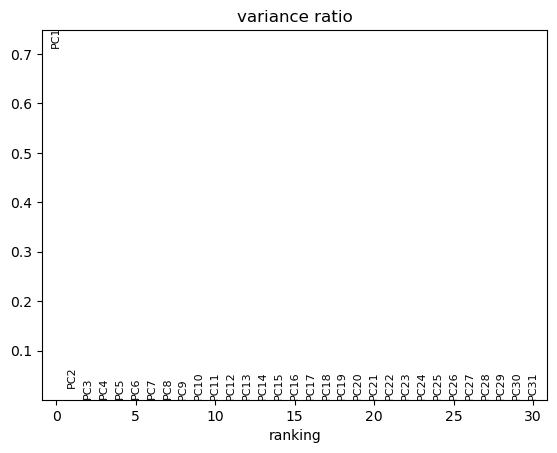

Downsample PC matrix to 50000 cells to calculate significant PC components
50 components passed P cutoff of 0.2.
Changing adata.obsm['X_pca'] from shape (82014, 50) to (82014, 50)


In [106]:
sc.pp.pca(adata_pse_concat, n_comps=50)
sc.pl.pca_variance_ratio(adata_pse_concat)
n_components = significant_pc_test(adata_pse_concat, p_cutoff=0.2)


In [107]:
#adata_pse_concat.obs['predicted_doublet'].fillna('False',inplace=True)
#adata_pse_concat.obs["predicted_doublet"] = adata_pse_concat.obs["predicted_doublet"].astype(bool)

adata_pse_concat.var['mt-0'] = adata_pse_concat.var["mt-0"].astype(bool)
#adata_concat.var['highly_variable-0-0'] = adata_concat.var["highly_variable-0-0"].astype(bool)
#adata_concat.var['highly_variable-1-0'] = adata_concat.var["highly_variable-1-0"].astype(bool)
#adata_concat.var['highly_variable-0'] = adata_concat.var["highly_variable-0"].astype(bool)

adata_pse_concat.obs['PassBasicQC'] = adata_pse_concat.obs["PassBasicQC"].astype(bool)


In [108]:
adata_pse_concat.write_h5ad('output/merged-3region-pseudo-clustering.h5ad')

In [109]:
atacsn = scps_hvf_list.intersection(atacps_hvf_list)

In [110]:
pse_atac = adata_atac_pseudo[:,atacsn].copy()
pse_sc = adata_sc_pseudo[:,atacsn].copy()

In [111]:
adata_pse_concat = pse_atac.concatenate([
    pse_sc    
],
                                index_unique='-')
adata_pse_concat.obs['batch'] = adata_pse_concat.obs['batch'].map({
    '0': 'sc',
    '1': 'atac'
    })
adata_pse_concat

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning:

The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html



AnnData object with n_obs × n_vars = 42014 × 2980
    obs: 'n_cells', 'leiden', 'n_counts', 'leiden_snap', 'celltype.L1', 'batch'
    var: 'highly_variable', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'chr-0', 'gene_name-0', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'feature_types-1', 'genome-1', 'mt-1', 'gane_name-1'

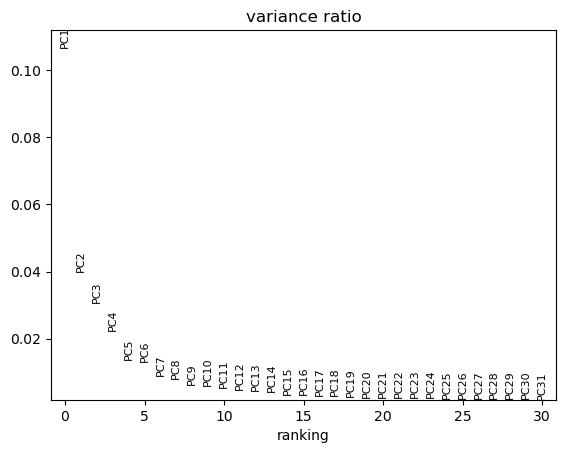

30 components passed P cutoff of 0.2.
Changing adata.obsm['X_pca'] from shape (42014, 50) to (42014, 30)


In [112]:
sc.pp.pca(adata_pse_concat, n_comps=50)
sc.pl.pca_variance_ratio(adata_pse_concat)
n_components = significant_pc_test(adata_pse_concat, p_cutoff=0.2)


In [113]:
adata_pse_concat.write_h5ad('output/atacsc-3region-pseudo-clustering.h5ad')

In [114]:
atacsn = sc_hvf_list.intersection(atac_hvf_list)

In [115]:
sub_atac = adata_atac_selected[:,atacsn].copy()
sub_sc = adata_sc[:,atacsn].copy()

In [116]:
adata_sub_concat = sub_sc.concatenate([
    sub_atac    
],
                                index_unique='-')
adata_sub_concat.obs['batch'] = adata_sub_concat.obs['batch'].map({
    '0': 'sc',
    '1': 'atac'
    })
adata_sub_concat

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning:

The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html



AnnData object with n_obs × n_vars = 874836 × 4065
    obs: 'batch', 'sex', 'treatment', 'mouseID', 'region', 'tech', 'batch_name', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'Louvain_clusters_res1.0', 'Leiden_clusters_res1.0', 'celltype.L1', 'pseudo_group', 'sample', 'sample_barcode', 'obs_names', 'celltype.L2.p', 'celltype.L1.p', 'leiden', 'celltype.L1.GBoost', 'celltype.L1.tab', 'umap_0', 'umap_1'
    var: 'highly_variable', 'feature_types-0', 'genome-0', 'mt-0', 'gane_name-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'chr-1', 'gene_name-1'
    obsm: 'X_umap', 'X_pca'
    layers: 'counts'

In [117]:
#adata_pse_concat.obs['predicted_doublet'].fillna('False',inplace=True)
#adata_pse_concat.obs["predicted_doublet"] = adata_pse_concat.obs["predicted_doublet"].astype(bool)

adata_sub_concat.var['mt-0'] = adata_sub_concat.var["mt-0"].astype(bool)
#adata_concat.var['highly_variable-0-0'] = adata_concat.var["highly_variable-0-0"].astype(bool)
#adata_concat.var['highly_variable-1-0'] = adata_concat.var["highly_variable-1-0"].astype(bool)
#adata_concat.var['highly_variable-0'] = adata_concat.var["highly_variable-0"].astype(bool)

#adata_sub_concat.obs['PassBasicQC'] = adata_sub_concat.obs["PassBasicQC"].astype(bool)


In [118]:
adata_sub_concat.write_h5ad('output/atacsc-3region-clustering.h5ad')

In [ ]:
sc.pp.neighbors(adata_concat, n_neighbors=5)
sc.tl.leiden(adata_concat, resolution=1.5)
sc.tl.umap(adata_concat)


In [ ]:
_ = plot_decomp_scatters(adata_concat,
                         n_components=n_components,
                         hue='batch',
                         palette='tab10')

In [ ]:
adata_concat.obs['umap_0'] = adata_concat.obsm['X_umap'][:, 0]
adata_concat.obs['umap_1'] = adata_concat.obsm['X_umap'][:, 1]


In [ ]:
fig, axes = plt.subplots(figsize=(8, 3), dpi=250, ncols=2)

ax = axes[0]
categorical_scatter(ax=ax,
                    data=adata_concat,
                    hue='batch',
                    show_legend=True,
                    max_points=None,
                    s=1)

ax = axes[1]
categorical_scatter(ax=ax,
                    data=adata_concat,
                    hue='pred_Class',
                    show_legend=True,
                    max_points=None,
                    s=1)

In [ ]:
adata_concat.obs.columns

In [ ]:
adata_concat.obs[adata_concat.obs['batch'] == 'mcg'].copy().columns

In [ ]:
fig, axes = plt.subplots(figsize=(8, 3), dpi=250, ncols=2)

data = adata_concat.obs[adata_concat.obs['batch'] == 'mcg'].copy()
#data['MajorType'] = data['SubType'].str.split('_').str[-1]
data2 = adata_concat.obs[adata_concat.obs['batch'] == 'atac'].copy()


ax = axes[0]
categorical_scatter(ax=ax,
                    data=data,
                    show_legend=False,
                    max_points=None,
                    hue='SubRegion',
                    text_anno='SubRegion',
                    s=1)

ax = axes[1]
categorical_scatter(ax=ax,
                    data=data2,
                    hue='leiden',
                    show_legend=True,
                    text_anno='leiden',

                    max_points=None,
                    s=1)

In [ ]:
adata_sc.obs.columns

In [ ]:
df_pred_class=pd.DataFrame(pd.crosstab(adata_concat.obs['pred_Class'], adata_concat.obs['leiden']).idxmax())

In [ ]:
df_class=pd.DataFrame(pd.crosstab(adata_concat.obs['Class'], adata_concat.obs['leiden']).idxmax())

In [ ]:
df_type_merged = df_pred_class.merge(df_class,how='outer',left_index=True,right_index=True).fillna(method='ffill').fillna(method='bfill')
df_type_merged.columns = ['pred_Class','Class']

In [ ]:
lei_map_class = dict(zip(df_type_merged.index,df_type_merged['Class']))
lei_map_pred_class = dict(zip(df_type_merged.index,df_type_merged['pred_Class']))

In [ ]:
adata_concat.obs

In [ ]:
adata_concat.obs

In [ ]:
mapped_class = []
mappled_preclass = []
for inde,row in (adata_concat.obs).iterrows():
    if row['leiden'] not in lei_map_class:
        mapped_class.append(row['leiden'])
        mappled_preclass.append(row['leiden'])
    else:
        mapped_class.append(lei_map_class[row['leiden']])
        mappled_preclass.append(lei_map_pred_class[row['leiden']])  


In [ ]:
adata_concat.obs['mapped_class'] = mapped_class
adata_concat.obs['mappled_preclass'] = mappled_preclass

In [ ]:
interactive_scatter(data=adata_concat,
                    hue='mappled_preclass',
                    coord_base='umap',
                    max_points=20000)

In [ ]:
interactive_scatter(data=adata_concat,
                    hue='mappled_preclass',
                    coord_base='umap',
                    max_points=10000)

In [ ]:
adata_concat.obs

In [ ]:
sc._utils.sanitize_anndata(adata_concat)

In [ ]:
adata_concat.obs['predicted_doublet'].fillna('False',inplace=True)
adata_concat.obs["predicted_doublet"] = adata_concat.obs["predicted_doublet"].astype(bool)

adata_concat.var['mt-0'] = adata_concat.var["mt-0"].astype(bool)
adata_concat.var['highly_variable-0-0'] = adata_concat.var["highly_variable-0-0"].astype(bool)
adata_concat.var['highly_variable-1-0'] = adata_concat.var["highly_variable-1-0"].astype(bool)
adata_concat.var['highly_variable-0'] = adata_concat.var["highly_variable-0"].astype(bool)


In [ ]:
adata_concat.write_h5ad('output/merged-clustering.h5ad')